# <span style='color:pink'> pakiety matematyczne - projekt  </span>
## <span style='color:pink'> Funkcja wycinająca określone częstotliwości  </span>

In [848]:
using FFTW
using WAV
using Plots

In [849]:
function remove_frequency(sound, fs, N, freq_start, freq_stop)
    tstep = 1/fs
    t = LinRange(0, (N-1)*tstep, N)
    fstep = fs/N
    f = LinRange(0, (N-1)*fstep, N)
    
    fhat = fft(sound)
    fhat[floor(Int, freq_start * N/f[end]):ceil(Int, freq_stop * N/f[end])] .= 0
    fhat[floor(Int, (f[end] - freq_stop) * N/f[end]):ceil(Int, (f[end] - freq_start) * N/f[end])] .= 0

    fhat_mag = abs.(fhat)/N
    return fhat, fhat_mag, f
end

remove_frequency (generic function with 3 methods)

## Dźwięk o częstotliwości 440Hz

In [850]:
sound, fs = wavread("440Hz.wav")[1][:, 1], Int(wavread("440Hz.wav")[2]);

In [851]:
tstep = 1/fs
N = length(sound)

220500

In [852]:
sound_fft = fft(sound)
sound_mag = abs.(sound_fft)/N;

In [853]:
sound_fft_filtered, sound_mag_filtered, sound_freq = remove_frequency(sound, fs, f0, N, 435, 445);

In [854]:
sound_mag_plot = sound_mag[1:Int(N/2 + 1)]
sound_mag_filtered_plot = 2 * sound_mag_filtered[1:Int(N/2+1)]
sound_mag_filtered_plot[1] = sound_mag_filtered_plot[1]/2
sound_freq_plot = sound_freq[1:Int(N/2+1)]

110251-element LinRange{Float64}:
 0.0,0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,…,22049.4,22049.6,22049.8,22050.0

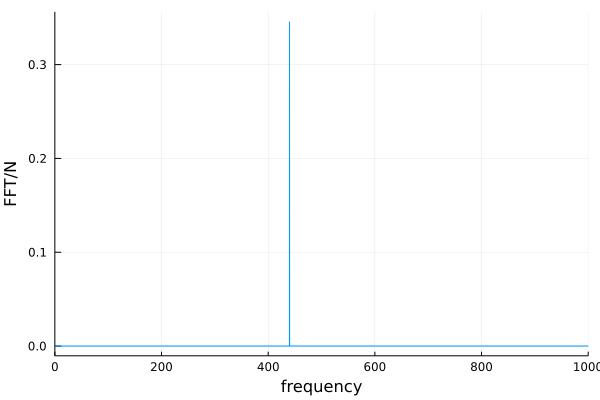

In [855]:
plot(sound_freq_plot, sound_mag_plot, x_lims = (0, 1000), xlabel = "frequency", ylabel = "FFT/N", label = "")

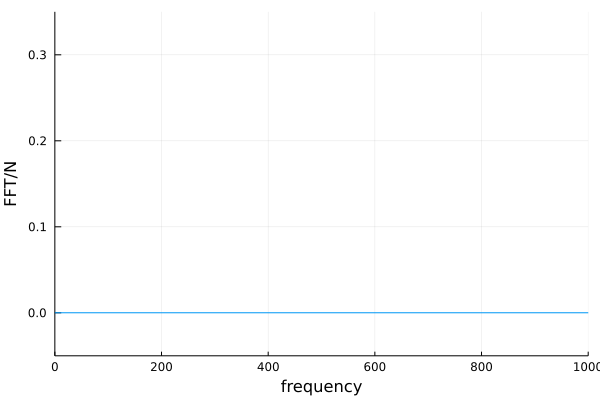

In [856]:
plot(sound_freq_plot, sound_mag_filtered_plot, x_lims = (0, 1000), y_lims = (-0.05, 0.35), xlabel = "frequency", ylabel = "FFT/N", label = "")

In [859]:
sound_filtered = ifft(sound_fft_filtered);

In [860]:
@time wavplay("440Hz.wav")

  5.524255 seconds (875.41 k allocations: 19.413 MiB)


In [861]:
@time wavplay(real.(sound_filtered), fs)

  5.511198 seconds (220.55 k allocations: 6.892 MiB)


## Dźwięk o częstotliwościach 50Hz i 120Hz

In [862]:
fs = 2000
tstep = 1/fs
f0 = 120
N = floor(Int, 100 * fs/f0)
t = LinRange(0, (N-1)*tstep, N)

1666-element LinRange{Float64}:
 0.0,0.0005,0.001,0.0015,0.002,0.0025,…,0.83,0.8305,0.831,0.8315,0.832,0.8325

In [863]:
f = sin.(2π * 50 * t) + sin.(2π * 120 * t)

1666-element Array{Float64,1}:
  0.0
  0.5245590177249088
  0.993564100303636
  1.3588175522055663
  1.5858119807207447
  1.658163297481701
  1.579530237150737
  1.3727601982900834
  1.0763897498594586
  0.7389984534302831
  0.4122147477075273
  0.14336041509312303
 -0.031230734433534857
  ⋮
  1.807043722803214
  1.6581632974817242
  1.3582984950683317
  0.9357441738413921
  0.43435022793932804
 -0.09225542212456112
 -0.5877852522923307
 -1.0007623905422287
 -1.291304245103622
 -1.4362777504682338
 -1.4321131777945662
 -1.2948920334790777

In [864]:
fhat = fft(f)
fhat_mag = abs.(fhat)/N

1666-element Array{Float64,1}:
 0.006421705945722925
 0.006425689186573653
 0.006437666168609655
 0.006457719143837811
 0.006485986792915129
 0.006522666670918546
 0.006568018744009007
 0.006622370136783946
 0.0066861212552743795
 0.006759753505093524
 0.006843838891766926
 0.006939051875505479
 0.007046183961987991
 ⋮
 0.007046183961987992
 0.006939051875505477
 0.006843838891766926
 0.00675975350509353
 0.006686121255274378
 0.006622370136783953
 0.006568018744009004
 0.006522666670918546
 0.006485986792915129
 0.006457719143837811
 0.00643766616860967
 0.006425689186573652

In [865]:
fhat_filtered, fhat_mag_filtered, freq = remove_frequency(f, fs, N,  115, 125)

(Complex{Float64}[10.698562105574393 + 0.0im, 10.704400749918147 + 0.13066277846375857im, 10.721957117611073 + 0.2617584626095796im, 10.751353215393365 + 0.3937249372091276im, 10.792794753306328 + 0.5270101667065837im, 10.846574774249804 + 0.6620775439633533im, 10.913078902483772 + 0.7994116243186078im, 10.992792388893431 + 0.9395243988877799im, 11.08630919787762 + 1.0829622849361866im, 11.194343461693279 + 1.2303140440773663im  …  11.317743728318487 - 1.3822198831951564im, 11.19434346169329 - 1.230314044077363im, 11.086309197877615 - 1.0829622849362148im, 10.992792388893442 - 0.9395243988877908im, 10.913078902483766 - 0.7994116243186105im, 10.846574774249802 - 0.6620775439633566im, 10.792794753306328 - 0.527010166706584im, 10.751353215393365 - 0.3937249372091271im, 10.7219571176111 - 0.26175846260956026im, 10.704400749918145 - 0.13066277846375865im], [0.006421705945722925, 0.006425689186573653, 0.006437666168609655, 0.006457719143837811, 0.006485986792915129, 0.006522666670918546, 0.0

In [866]:
fhat_mag_plot = fhat_mag[1:Int(N/2 + 1)]
fhat_mag_filtered_plot = 2 * fhat_mag_filtered[1:Int(N/2+1)]
fhat_mag_filtered_plot[1] = fhat_mag_filtered_plot[1]/2
freq_plot = freq[1:Int(N/2+1)]

834-element LinRange{Float64}:
 0.0,1.20048,2.40096,3.60144,4.80192,…,995.198,996.399,997.599,998.8,1000.0

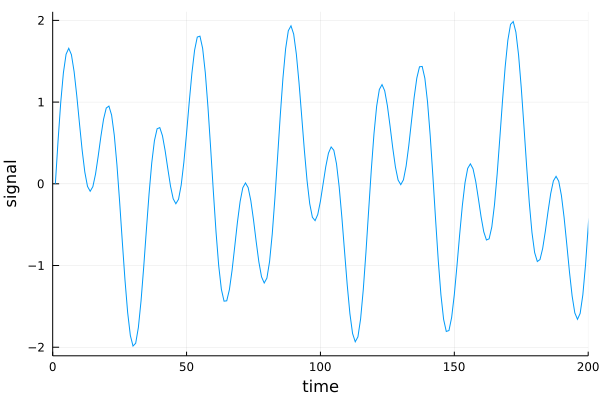

In [867]:
plot(f, x_lims = (0, 200), xlabel = "time", ylabel = "signal", label = "")

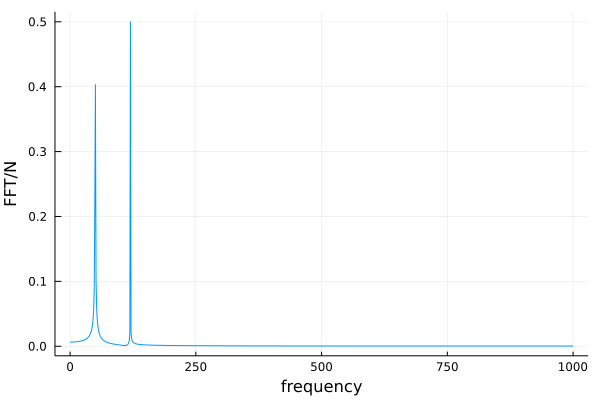

In [868]:
plot(freq_plot, fhat_mag_plot, xlabel = "frequency", ylabel = "FFT/N", label = "")

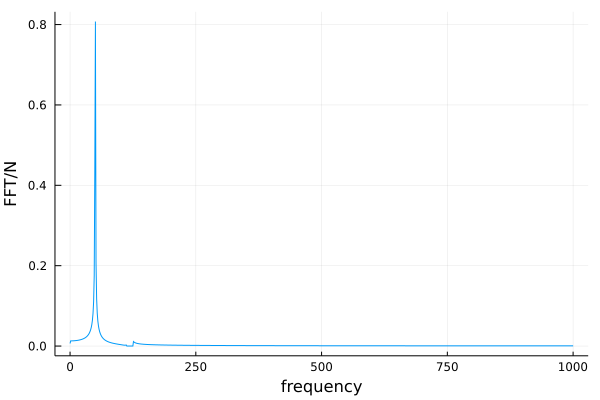

In [869]:
plot(freq_plot, fhat_mag_filtered_plot, xlabel = "frequency", ylabel = "FFT/N", label = "")

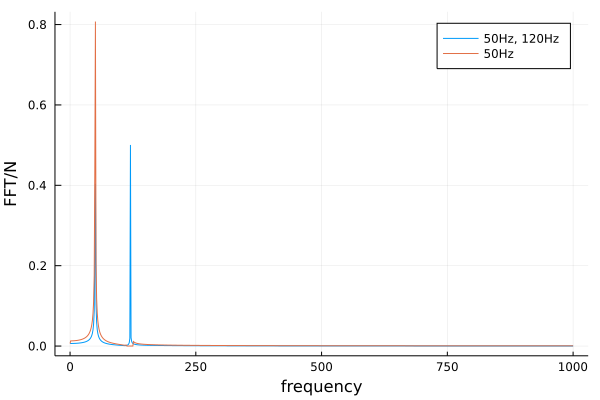

In [870]:
plot(freq_plot, fhat_mag_plot, xlabel = "frequency", ylabel = "FFT/N", label = "50Hz, 120Hz")
plot!(freq_plot, fhat_mag_filtered_plot, label = "50Hz")

In [871]:
wavwrite(f, "50_120Hz.wav")

In [872]:
filtered = ifft(fhat_filtered);

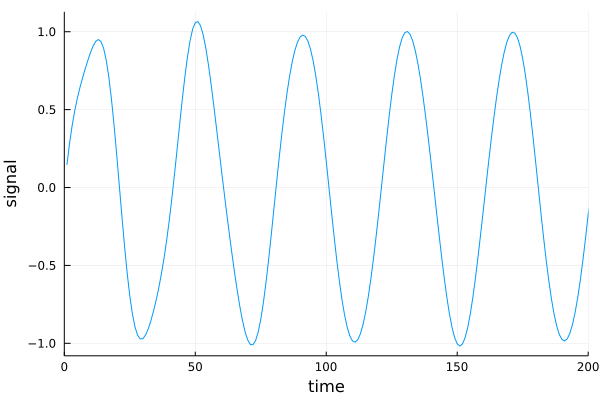

In [873]:
plot(real.(filtered), x_lims = (0, 200), xlabel = "time", ylabel = "signal", label = "")

In [874]:
wavwrite(abs.(filtered), "50Hz.wav")

In [875]:
wavplay("50_120Hz.wav")

In [876]:
wavplay("50Hz.wav")

## Śpiew ptaka

In [877]:
bird, bird_fs = wavread("bird.wav")[1][:, 1], Int(wavread("bird.wav")[2])

([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 48000)

In [878]:
bird_tstep = 1/bird_fs
bird_N = length(bird)

194688

In [879]:
bird_fft = fft(bird)
bird_mag = abs.(bird_fft)/bird_N;

In [880]:
bird_fft_filtered, bird_mag_filtered, bird_freq = remove_frequency(bird, bird_fs, bird_N, 3000, 5000);

In [881]:
bird_mag_plot = bird_mag[1:Int(bird_N/2 + 1)]
bird_mag_filtered_plot = 2 * bird_mag_filtered[1:Int(bird_N/2+1)]
bird_mag_filtered_plot[1] = bird_mag_filtered_plot[1]/2
bird_freq_plot = bird_freq[1:Int(bird_N/2+1)]

97345-element LinRange{Float64}:
 0.0,0.246548,0.493097,0.739645,0.986193,…,23999.3,23999.5,23999.8,24000.0

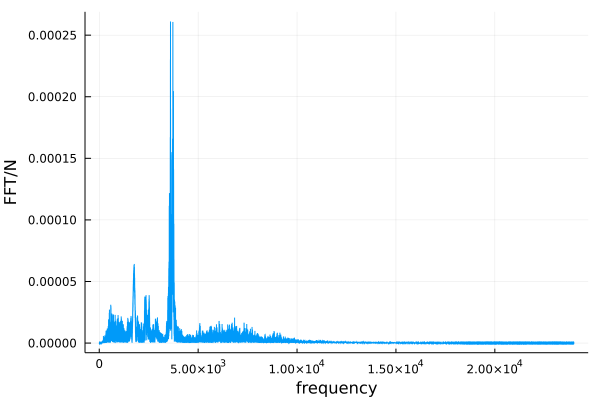

In [882]:
plot(bird_freq_plot, bird_mag_plot, xlabel = "frequency", ylabel = "FFT/N", label = "")

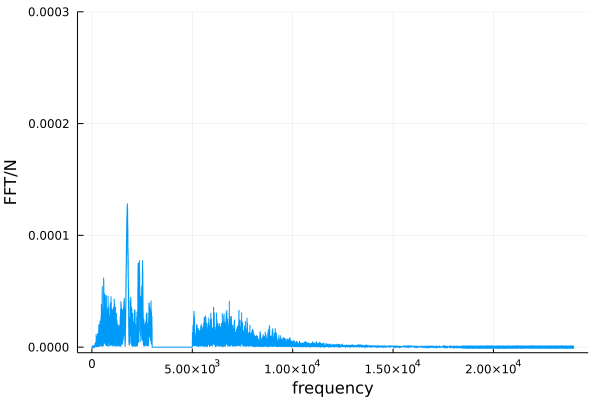

In [883]:
plot(bird_freq_plot, bird_mag_filtered_plot, y_lims = (-0.000005, 0.0003), xlabel = "frequency", ylabel = "FFT/N", label = "")

In [884]:
plot(bird_freq_plot, bird_mag_plot, xlabel = "frequency", ylabel = "FFT/N", label = "Initial bird")
plot!(bird_freq_plot, bird_mag_filtered_plot, label = "Filtered bird")

In [885]:
bird_filtered = ifft(bird_fft_filtered);

In [886]:
wavplay("bird.wav")

In [892]:
wavplay(real.(bird_filtered), bird_fs)

In [893]:
bird_fft_filtered2, bird_mag_filtered2, bird_freq2 = remove_frequency(bird, bird_fs, bird_N, 1, 3000)
bird_fft_filtered2, bird_mag_filtered2, bird_freq2 = remove_frequency(real.(ifft(bird_fft_filtered2)), bird_fs, bird_N, 5000, 24000);

In [898]:
bird_mag_filtered_plot2 = bird_mag_filtered2[1:Int(bird_N/2+1)]

97345-element Array{Float64,1}:
 4.18538483629783e-8
 3.8058301352279496e-8
 2.2509969555100568e-8
 1.4094847099708014e-8
 1.8026977833137096e-8
 4.649834289645833e-21
 1.3791179778616701e-21
 4.545416312871051e-21
 2.7714841197657495e-21
 3.20357997149479e-21
 4.357846648534089e-21
 4.2024918160929085e-21
 3.908205408398416e-21
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

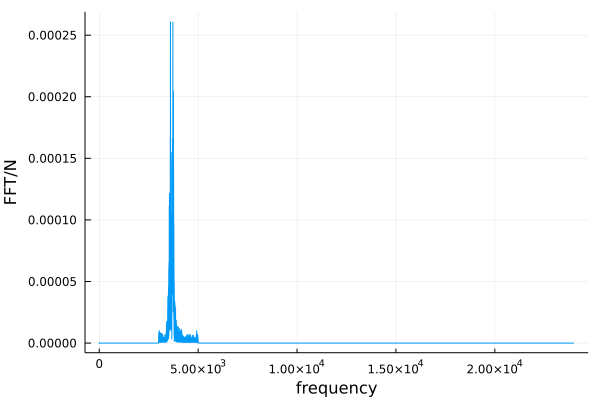

In [899]:
plot(bird_freq_plot, bird_mag_filtered_plot2, xlabel = "frequency", ylabel = "FFT/N", label = "")

In [900]:
bird_filtered2 = ifft(bird_fft_filtered2)

194688-element Array{Complex{Float64},1}:
   7.111937350647133e-7 - 1.4239822904560798e-6im
   8.913575427807724e-7 - 1.4476330784830909e-6im
  4.7097900766052005e-7 - 8.730228492845177e-7im
  -6.048017033995193e-7 + 6.240502656439286e-8im
 -2.0406051991316568e-6 + 9.720823599070868e-7im
  -3.289880598911754e-6 + 1.480066529630487e-6im
 -3.7731892427382365e-6 + 1.376406401429308e-6im
  -3.126771218281819e-6 + 7.039156591652708e-7im
 -1.3774073839114421e-6 - 2.595100869978306e-7im
  1.0323352846138792e-6 - 1.1157290369656924e-6im
  3.3844066392088137e-6 - 1.5108878248751884e-6im
  4.9396538745308505e-6 - 1.2816600540209229e-6im
   5.207665316784156e-6 - 5.227521006641131e-7im
                        ⋮
 -4.7668964609337305e-6 + 5.215622836774086e-7im
  -3.661738777626926e-6 - 4.529360993450292e-7im
 -1.6173107913012697e-6 - 1.2402911843879381e-6im
   6.863284248683859e-7 - 1.515105536483471e-6im
   2.534768059401843e-6 - 1.1637852110929405e-6im
   3.438503833623585e-6 - 3.314935749336291

In [901]:
wavplay(real.(bird_filtered2), bird_fs)